In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!unzip /content/drive/MyDrive/sardata_small.zip -d /content/

In [3]:
import os
# import cv2
import torch

import pandas as pd
# import numpy as np
import torch.optim as optim
import matplotlib.pyplot as plt

from torch import manual_seed
# from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
# from torchvision.io import decode_image
from PIL import Image
from torchvision import transforms
from torch import nn
# from tqdm import tqdm

In [4]:
CSV_FILE_PATH = './sardata_small.csv'
IMAGE_DIR_SAR = './sardata_small/s1'
IMAGE_DIR_COL = './sardata_small/s2'
IMAGE_SIZE = (256, 256)
BATCH_SIZE = 16
SEED = 42
manual_seed(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else "cpu")
print(f"device: {DEVICE}")

device: cuda


In [5]:
data_df = pd.read_csv(CSV_FILE_PATH)

# train_df, test_df = train_test_split(data_df, test_size=0.15, random_state=SEED, shuffle=True, stratify=data_df['type'])
# print(train_df.groupby('type').count())
# print(test_df.groupby('type').count())

In [6]:
class SarColorDataset(Dataset):
    def __init__(self, data_df, image_dir_sar, image_dir_col, transform_sar=None, transform_col=None):
        self.data_df = data_df
        self.image_dir_sar = image_dir_sar
        self.image_dir_col = image_dir_col
        self.transform_sar = transform_sar
        self.transform_col = transform_col

    def __len__(self):
        return len(self.data_df)

    def __getitem__(self, index):
        row = self.data_df.iloc[index]
        label = row['type']

        image_path_sar = os.path.join(self.image_dir_sar, row['s1_image'])
        image_path_col = os.path.join(self.image_dir_col, row['s2_image'])

        # image_sar = decode_image(image_path_sar, mode='GRAY')
        # image_col = decode_image(image_path_col, mode='RGB')

        # image_sar = cv2.imread(image_path_sar, cv2.IMREAD_GRAYSCALE)
        # image_col = cv2.imread(image_path_col, cv2.IMREAD_COLOR_RGB)

        image_sar = Image.open(image_path_sar).convert('L')
        image_col = Image.open(image_path_col).convert('RGB')

        if self.transform_sar:
            image_sar = self.transform_sar(image_sar)

        if self.transform_col:
            image_col = self.transform_col(image_col)

        return image_sar, image_col, label

In [7]:
transform_sar = transforms.Compose([
    transforms.Resize(size=IMAGE_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,), std=(0.5,), inplace=False),
])

transform_col = transforms.Compose([
    transforms.Resize(size=IMAGE_SIZE, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5), inplace=False),
])

In [8]:
dataset = SarColorDataset(
    data_df=data_df,
    image_dir_sar=IMAGE_DIR_SAR,
    image_dir_col=IMAGE_DIR_COL,
    transform_sar=transform_sar,
    transform_col=transform_col,
)

dataloader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

In [9]:
class DownSample(nn.Module):
    def __init__(self, inp_c, out_c, kernel_size=4, stride=2, padding=1, use_bias=True, normalization='batch'):
        super(DownSample, self).__init__()

        self.down = nn.Sequential(
            nn.Conv2d(in_channels=inp_c, out_channels=out_c, kernel_size=kernel_size, stride=stride, padding=padding, bias=(not normalization) and use_bias),
        )

        if (normalization == 'batch'):
            self.down.append(nn.BatchNorm2d(num_features=out_c, eps=1e-5, momentum=0.1, affine=True, track_running_stats=True))
        elif (normalization == 'instance'):
            self.down.append(nn.InstanceNorm2d(num_features=out_c, eps=1e-5, momentum=0.1, affine=False, track_running_stats=False))

        self.down.append(nn.LeakyReLU(negative_slope=0.2, inplace=False))

    def forward(self, x):
        x = self.down(x)
        return x

class UpSample(nn.Module):
    # def __init__(self, inp_c, out_c, kernel_size=4, stride=1, padding=0, use_bias = True, normalization='batch', apply_dropout=False, dropout_rate=0.5):
    def __init__(self, inp_c, out_c, kernel_size=4, stride=2, padding=1, use_bias = True, normalization='batch', apply_dropout=False, dropout_rate=0.5):
        super(UpSample, self).__init__()

        # self.up = nn.Sequential(
        #     nn.Upsample(scale_factor=2, mode='bilinear'),
        #     nn.ZeroPad2d((2,1,2,1)),
        #     nn.Conv2d(in_channels=inp_c, out_channels=out_c, kernel_size=kernel_size, stride=stride, padding=padding, bias=(not normalization) and use_bias),
        # )

        self.up = nn.Sequential(
            nn.ConvTranspose2d(in_channels=inp_c, out_channels=out_c, kernel_size=kernel_size, stride=stride, padding=padding, bias=(not normalization) and use_bias),
        )

        if (normalization == 'batch'):
            self.up.append(nn.BatchNorm2d(num_features=out_c, eps=1e-5, momentum=0.1, affine=True, track_running_stats=True))
        elif (normalization == 'isinstance'):
            self.up.append(nn.InstanceNorm2d(num_features=out_c, eps=1e-5, momentum=0.1, affine=False, track_running_stats=False))

        if apply_dropout:
            self.up.append(nn.Dropout(p=dropout_rate, inplace=False))

        self.up.append(nn.ReLU(inplace=False))

    def forward(self, x, skip):
        x = self.up(x)
        x = torch.cat([x, skip], dim=1)
        return x

class Generator(nn.Module):
    def __init__(self, in_channels=1, out_channels=3):
        super(Generator, self).__init__()

        self.down_stack = nn.ModuleList([
            DownSample(inp_c=in_channels, out_c=64, normalization=None),
            DownSample(inp_c= 64, out_c=128),
            DownSample(inp_c=128, out_c=256),
            DownSample(inp_c=256, out_c=512),
            DownSample(inp_c=512, out_c=512),
            DownSample(inp_c=512, out_c=512),
            DownSample(inp_c=512, out_c=512),
            DownSample(inp_c=512, out_c=512, normalization=None),
            ])

        self.up_stack = nn.ModuleList([
            UpSample(inp_c= 512, out_c=512), # removed dropout layers
            UpSample(inp_c=1024, out_c=512),
            UpSample(inp_c=1024, out_c=512),
            UpSample(inp_c=1024, out_c=512),
            UpSample(inp_c=1024, out_c=256),
            UpSample(inp_c= 512, out_c=128),
            UpSample(inp_c= 256, out_c= 64),
            ])

        self.final = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear'),
            nn.ZeroPad2d((2,1,2,1)),
            nn.Conv2d(in_channels=128, out_channels=out_channels, kernel_size=4, stride=1, padding=0, bias=True),
            nn.Tanh()
        )

    def forward(self, x):

        skips = []
        for layer in self.down_stack:
            x = layer(x)
            skips.append(x)

        skips.pop()
        skips = skips[::-1]

        for layer, skip in zip(self.up_stack, skips):
            x = layer(x, skip)

        x = self.final(x)
        return x

class Discriminator(nn.Module):
    def __init__(self, in_channels=4):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            DownSample(inp_c=in_channels, out_c=64, normalization=None),
            DownSample(inp_c= 64, out_c=128),
            DownSample(inp_c=128, out_c=256),
            DownSample(inp_c=256, out_c=512, stride=1, padding=1),
            nn.Conv2d(in_channels=512, out_channels=1, kernel_size=4, stride=1, padding=1, bias=True),
        )

        # self.model = nn.Sequential(
        #     DownSample(inp_c=in_channels, out_c=64, normalization=None),
        #     DownSample(inp_c= 64, out_c=128),
        #     DownSample(inp_c=128, out_c=256, padding=0),
        #     nn.Conv2d(in_channels=256, out_channels=1, kernel_size=4, stride=1, padding=1, bias=True),
        # )

    def forward(self, sar_img, col_img):
        x = torch.cat([sar_img, col_img], dim=1)
        x = self.model(x)
        return x

In [10]:
generator = Generator(in_channels=1, out_channels=3).to(device=DEVICE)
discriminator = Discriminator(in_channels=4).to(device=DEVICE)

In [11]:
def initialize_weights(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        nn.init.normal_(m.weight, mean=0.0, std=0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

In [12]:
generator.apply(initialize_weights)

Generator(
  (down_stack): ModuleList(
    (0): DownSample(
      (down): Sequential(
        (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
    )
    (1): DownSample(
      (down): Sequential(
        (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2)
      )
    )
    (2): DownSample(
      (down): Sequential(
        (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2)
      )
    )
    (3): DownSample(
      (down): Sequential(
        (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, aff

In [13]:
discriminator.apply(initialize_weights)

Discriminator(
  (model): Sequential(
    (0): DownSample(
      (down): Sequential(
        (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
        (1): LeakyReLU(negative_slope=0.2)
      )
    )
    (1): DownSample(
      (down): Sequential(
        (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2)
      )
    )
    (2): DownSample(
      (down): Sequential(
        (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.2)
      )
    )
    (3): DownSample(
      (down): Sequential(
        (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affi

In [14]:
# from torchsummary import summary

# summary(generator, input_size=(1, 256, 256))

In [15]:
# summary(discriminator, input_size=[(1, 256, 256), (3, 256, 256)])

In [16]:
# def rgb_to_lab(rgb):
#     '''
#     in:  tensor (b, c, h, w) [-1, 1]
#     out: tensor (b, c, h, w) [0, 1]
#     '''
#     rgb = (rgb + 1) / 2 # [0, 1] (b, c, h, w)

#     rgb = torch.where(rgb <= 0.04045, rgb / 12.92, ((rgb + 0.055) / 1.055) ** 2.4) # gamma correction

#     rgb_to_xyz_matrix = torch.tensor([
#         [0.4124564, 0.2126729, 0.0193339],
#         [0.3575761, 0.7151522, 0.1191920],
#         [0.1804375, 0.0721750, 0.9503041]
#         ])

#     xyz = torch.matmul(torch.permute(rgb, (0, 2, 3, 1)), rgb_to_xyz_matrix) #rgb to xyz colorspace [0, 1]
#     #                     (b, c, h, w) to (b, h, w, c)

#     # xyz = xyz * 100.0
#     # xyz = xyz / torch.tensor([95.047, 100.0, 108.883]) # divison by ref 2° D65 values

#     xyz = xyz / torch.tensor([0.95047, 1.0, 1.08883])

#     delta = 6/29
#     xyz = torch.where(xyz > delta**3, xyz**(1/3), (4/29) + (xyz / (3 * delta**2)))

#     x = xyz[:, :, :, 0]
#     y = xyz[:, :, :, 1]
#     z = xyz[:, :, :, 2]

#     l = ((116 * y) - 16) / 100.0            #    [0, 100] to [0, 1]
#     a = (500 * (x - y) + 128) / 255.0       # [-128, 127] to [0, 1]
#     b = (200 * (y - z) + 128) / 255.0       # [-128, 127] to [0, 1]

#     lab = torch.stack([l, a, b], dim=1)

#     return lab

In [17]:
bce_loss = nn.BCEWithLogitsLoss().to(device=DEVICE)
mae_loss = nn.L1Loss().to(device=DEVICE)

RGB_TO_Y_MATRIX = torch.tensor([
    [0.2126729],
    [0.7151522],
    [0.0721750]
], device=DEVICE)

def get_L(rgb):
    '''
    get L from CIELAB colorspace

    in:  tensor (b, c, h, w) [-1, 1]
    out: tensor (b, h, w) [0, 1]
    '''
    rgb = (rgb + 1) / 2 # [0, 1] (b, c, h, w)

    rgb = torch.where(rgb <= 0.04045, rgb / 12.92, ((rgb + 0.055) / 1.055) ** 2.4) # gamma correction

    global RGB_TO_Y_MATRIX
    y = torch.matmul(torch.permute(rgb, (0, 2, 3, 1)), RGB_TO_Y_MATRIX).squeeze(-1) # rgb to y from xyz colorspace [0, 1]
    #                     (b, c, h, w) to (b, h, w, c)

    y = torch.clamp(y, min=1e-6)  # Avoid negative or zero values

    delta = 6/29
    y = torch.where(y > delta**3, y**(1/3), (4/29) + (y / (3 * delta**2)))

    l = ((116 * y) - 16) / 100.0 # [0, 100] to [0, 1]

    return l

def generator_loss(generated, target, patch_fake, lambda_image=100.0, lambda_gradient=100.0):
    # generated_lab = rgb_to_lab(generated)
    # target_lab = rgb_to_lab(target)

    # gen_L = generated_lab[:, 0, :, :]
    # tar_L = target_lab[:, 0, :, :]

    gen_L = get_L(generated)
    tar_L = get_L(target)

    gen_L_h = torch.diff(gen_L, dim=1)
    tar_L_h = torch.diff(tar_L, dim=1)

    gen_L_w = torch.diff(gen_L, dim=2)
    tar_L_w = torch.diff(tar_L, dim=2)

    bce_loss_G = bce_loss(patch_fake, torch.full_like(patch_fake, fill_value=0.9, device=DEVICE))
    img_loss_G = mae_loss(generated, target)
    grd_loss_G = mae_loss(gen_L_h, tar_L_h) + mae_loss(gen_L_w, tar_L_w)

    loss_G = bce_loss_G + lambda_image * img_loss_G + lambda_gradient * grd_loss_G

    return loss_G, bce_loss_G.item(), img_loss_G.item(), grd_loss_G.item()

def discriminator_loss(patch_fake, patch_valid):
    valid_loss_D = bce_loss(patch_valid, torch.full_like(patch_valid, fill_value=0.9, device=DEVICE))
    fake_loss_D = bce_loss(patch_fake, torch.full_like(patch_fake, fill_value=0.1, device=DEVICE))

    loss_D = 0.5 * (valid_loss_D + fake_loss_D)

    return  loss_D, valid_loss_D.item(), fake_loss_D.item()

In [18]:
optimizer_G = optim.Adam(generator.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=1e-5, betas=(0.5, 0.999))

In [19]:
def visualize_results(sar, fake, col):
    """
    Display SAR (grayscale), FAKE (RGB), and COL (RGB) images side by side.

    Args:
        sar (torch.Tensor): Grayscale image (1, H, W), range [-1, 1].
        fake (torch.Tensor): RGB image (3, H, W), range [-1, 1].
        col (torch.Tensor): RGB image (3, H, W), range [-1, 1].
    """
    def tensor_to_image(tensor, cmap=None):
        tensor = (tensor.clamp(-1, 1) + 1) / 2  # Normalize [-1,1] to [0,1]
        tensor = tensor.cpu().detach().numpy()  # Convert to NumPy
        if tensor.shape[0] == 1:  # Grayscale (1, H, W) -> (H, W)
            return tensor[0], "gray"
        return tensor.transpose(1, 2, 0), None  # RGB (3, H, W) -> (H, W, 3)

    images = [sar, fake, col]
    titles = ["SAR", "Generated", "Optical"]

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    for ax, img, title in zip(axes, images, titles):
        img, cmap = tensor_to_image(img)
        ax.imshow(img, cmap=cmap)
        ax.set_title(title)

    plt.show()


Epoch [001/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.763464 Loss_G: 42.037685 | Valid_D: 0.781511 Fake_D: 0.745416 | BCE_G: 0.779636 Img_G: 0.304961 Grd_G: 0.107620
Batch [050/125] | Loss_D: 0.715511 Loss_G: 43.401005 | Valid_D: 0.734385 Fake_D: 0.696638 | BCE_G: 0.791914 Img_G: 0.313168 Grd_G: 0.112923
Batch [075/125] | Loss_D: 0.676090 Loss_G: 42.499313 | Valid_D: 0.694192 Fake_D: 0.657989 | BCE_G: 0.837530 Img_G: 0.302148 Grd_G: 0.114470
Batch [100/125] | Loss_D: 0.597819 Loss_G: 41.933117 | Valid_D: 0.621691 Fake_D: 0.573948 | BCE_G: 0.943189 Img_G: 0.319734 Grd_G: 0.090165
Batch [125/125] | Loss_D: 0.558342 Loss_G: 44.590477 | Valid_D: 0.577223 Fake_D: 0.539461 | BCE_G: 1.004962 Img_G: 0.323681 Grd_G: 0.112174
----------------------------------------------------
Epoch [001/100] | Loss_D: 0.681997 Loss_G: 43.800459 (Epoch Average)


Epoch [002/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.479863 Lo

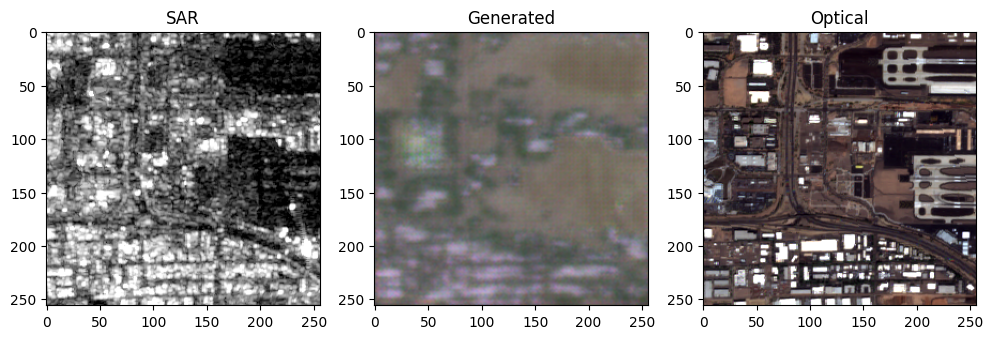


Epoch [004/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.444508 Loss_G: 41.887756 | Valid_D: 0.398618 Fake_D: 0.490398 | BCE_G: 1.152454 Img_G: 0.314920 Grd_G: 0.092433
Batch [050/125] | Loss_D: 0.433085 Loss_G: 43.098145 | Valid_D: 0.426248 Fake_D: 0.439923 | BCE_G: 1.310434 Img_G: 0.309642 Grd_G: 0.108235
Batch [075/125] | Loss_D: 0.426589 Loss_G: 42.526543 | Valid_D: 0.431041 Fake_D: 0.422137 | BCE_G: 1.348193 Img_G: 0.305840 Grd_G: 0.105944
Batch [100/125] | Loss_D: 0.366877 Loss_G: 45.426628 | Valid_D: 0.360661 Fake_D: 0.373093 | BCE_G: 1.576883 Img_G: 0.325932 Grd_G: 0.112566
Batch [125/125] | Loss_D: 0.372716 Loss_G: 43.588192 | Valid_D: 0.379323 Fake_D: 0.366110 | BCE_G: 1.576232 Img_G: 0.314093 Grd_G: 0.106027
----------------------------------------------------
Epoch [004/100] | Loss_D: 0.422525 Loss_G: 43.130187 (Epoch Average)


Epoch [005/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.414094 Lo

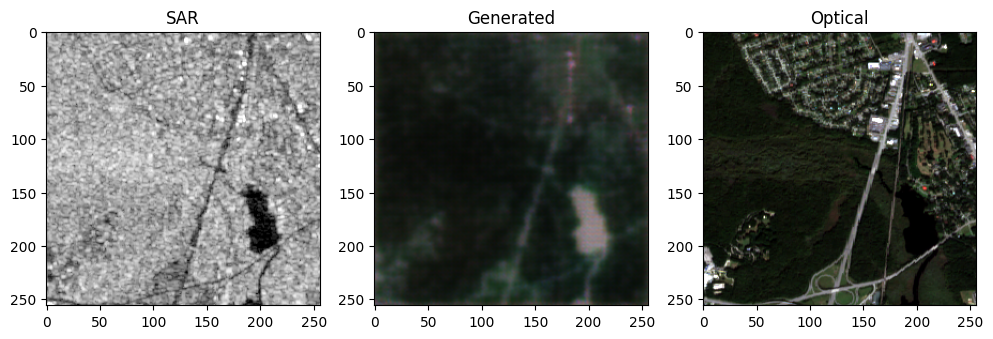


Epoch [007/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.438634 Loss_G: 41.773251 | Valid_D: 0.536449 Fake_D: 0.340819 | BCE_G: 2.013606 Img_G: 0.294533 Grd_G: 0.103063
Batch [050/125] | Loss_D: 0.366585 Loss_G: 40.701294 | Valid_D: 0.345402 Fake_D: 0.387768 | BCE_G: 1.497354 Img_G: 0.293087 Grd_G: 0.098953
Batch [075/125] | Loss_D: 0.373182 Loss_G: 38.451141 | Valid_D: 0.397676 Fake_D: 0.348688 | BCE_G: 1.683031 Img_G: 0.275993 Grd_G: 0.091688
Batch [100/125] | Loss_D: 0.389970 Loss_G: 42.066311 | Valid_D: 0.425978 Fake_D: 0.353963 | BCE_G: 1.639137 Img_G: 0.309743 Grd_G: 0.094529
Batch [125/125] | Loss_D: 0.496953 Loss_G: 42.131454 | Valid_D: 0.545721 Fake_D: 0.448185 | BCE_G: 1.189655 Img_G: 0.307913 Grd_G: 0.101505
----------------------------------------------------
Epoch [007/100] | Loss_D: 0.382407 Loss_G: 42.707177 (Epoch Average)


Epoch [008/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.410859 Lo

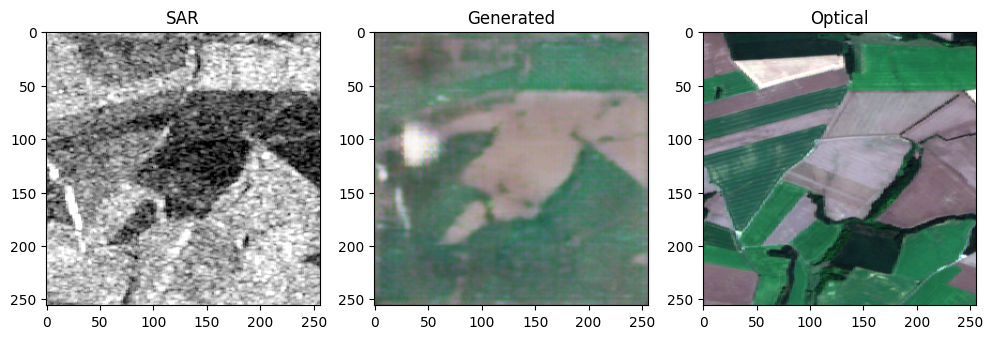


Epoch [010/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.368407 Loss_G: 41.468044 | Valid_D: 0.360916 Fake_D: 0.375898 | BCE_G: 1.531179 Img_G: 0.293904 Grd_G: 0.105464
Batch [050/125] | Loss_D: 0.360873 Loss_G: 44.926151 | Valid_D: 0.345219 Fake_D: 0.376526 | BCE_G: 1.548478 Img_G: 0.331873 Grd_G: 0.101903
Batch [075/125] | Loss_D: 0.358103 Loss_G: 36.783463 | Valid_D: 0.379855 Fake_D: 0.336350 | BCE_G: 2.201198 Img_G: 0.261695 Grd_G: 0.084127
Batch [100/125] | Loss_D: 0.348180 Loss_G: 44.530819 | Valid_D: 0.341748 Fake_D: 0.354611 | BCE_G: 1.745012 Img_G: 0.311304 Grd_G: 0.116554
Batch [125/125] | Loss_D: 0.335836 Loss_G: 41.633495 | Valid_D: 0.335214 Fake_D: 0.336457 | BCE_G: 1.960551 Img_G: 0.279298 Grd_G: 0.117431
----------------------------------------------------
Epoch [010/100] | Loss_D: 0.377659 Loss_G: 41.448508 (Epoch Average)


Epoch [011/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.343192 Lo

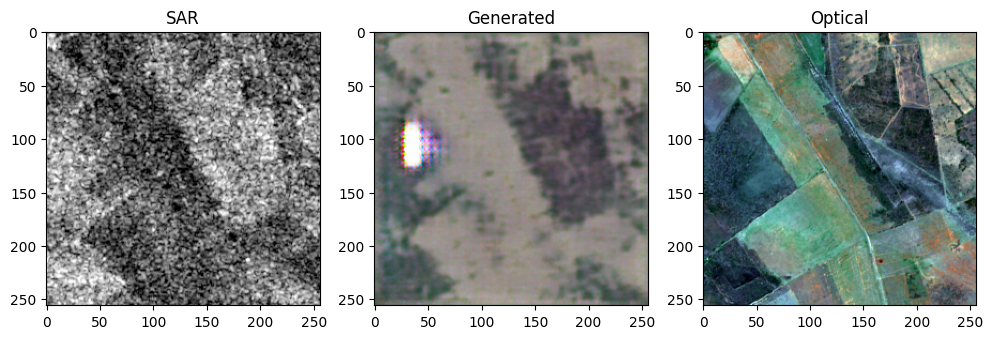


Epoch [013/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.340611 Loss_G: 39.709469 | Valid_D: 0.335353 Fake_D: 0.345868 | BCE_G: 1.815780 Img_G: 0.269281 Grd_G: 0.109656
Batch [050/125] | Loss_D: 0.360925 Loss_G: 44.937145 | Valid_D: 0.386747 Fake_D: 0.335102 | BCE_G: 2.096916 Img_G: 0.300360 Grd_G: 0.128042
Batch [075/125] | Loss_D: 0.402565 Loss_G: 38.063950 | Valid_D: 0.335889 Fake_D: 0.469242 | BCE_G: 1.447327 Img_G: 0.265577 Grd_G: 0.100589
Batch [100/125] | Loss_D: 0.350165 Loss_G: 40.536751 | Valid_D: 0.336069 Fake_D: 0.364261 | BCE_G: 1.723757 Img_G: 0.287303 Grd_G: 0.100827
Batch [125/125] | Loss_D: 0.370562 Loss_G: 40.872108 | Valid_D: 0.379647 Fake_D: 0.361477 | BCE_G: 1.593302 Img_G: 0.280353 Grd_G: 0.112435
----------------------------------------------------
Epoch [013/100] | Loss_D: 0.374457 Loss_G: 40.250638 (Epoch Average)


Epoch [014/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.341262 Lo

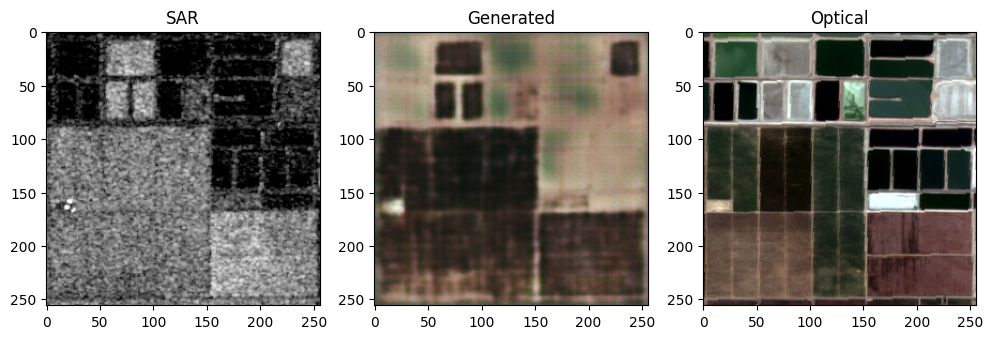


Epoch [016/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.335081 Loss_G: 36.941853 | Valid_D: 0.335924 Fake_D: 0.334238 | BCE_G: 2.141224 Img_G: 0.250148 Grd_G: 0.097858
Batch [050/125] | Loss_D: 0.345209 Loss_G: 38.077000 | Valid_D: 0.336017 Fake_D: 0.354400 | BCE_G: 1.720918 Img_G: 0.251536 Grd_G: 0.112025
Batch [075/125] | Loss_D: 0.361790 Loss_G: 38.679977 | Valid_D: 0.349091 Fake_D: 0.374488 | BCE_G: 1.593059 Img_G: 0.277665 Grd_G: 0.093204
Batch [100/125] | Loss_D: 0.463569 Loss_G: 36.738956 | Valid_D: 0.567940 Fake_D: 0.359199 | BCE_G: 1.600467 Img_G: 0.252874 Grd_G: 0.098511
Batch [125/125] | Loss_D: 0.419639 Loss_G: 35.359692 | Valid_D: 0.491243 Fake_D: 0.348035 | BCE_G: 1.684913 Img_G: 0.236670 Grd_G: 0.100078
----------------------------------------------------
Epoch [016/100] | Loss_D: 0.379305 Loss_G: 38.835723 (Epoch Average)


Epoch [017/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.421228 Lo

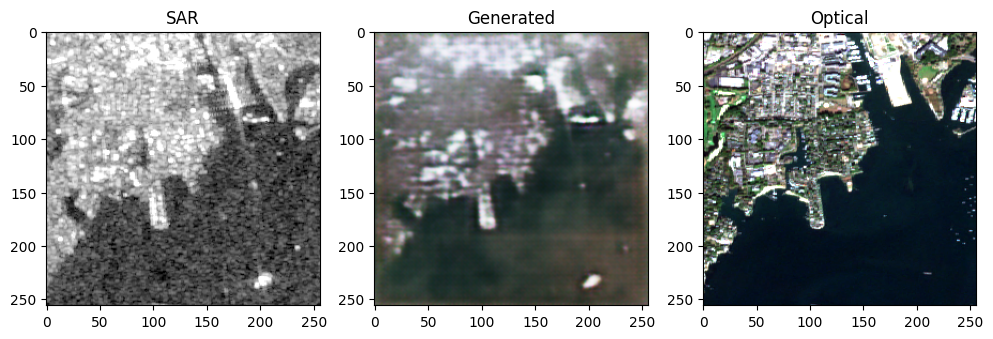


Epoch [019/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.369419 Loss_G: 36.751999 | Valid_D: 0.398722 Fake_D: 0.340116 | BCE_G: 1.831514 Img_G: 0.241230 Grd_G: 0.107974
Batch [050/125] | Loss_D: 0.346060 Loss_G: 36.836918 | Valid_D: 0.357462 Fake_D: 0.334658 | BCE_G: 2.091742 Img_G: 0.247698 Grd_G: 0.099754
Batch [075/125] | Loss_D: 0.350037 Loss_G: 36.179962 | Valid_D: 0.336064 Fake_D: 0.364010 | BCE_G: 1.677071 Img_G: 0.251549 Grd_G: 0.093480
Batch [100/125] | Loss_D: 0.378593 Loss_G: 37.335175 | Valid_D: 0.414324 Fake_D: 0.342862 | BCE_G: 2.535881 Img_G: 0.241452 Grd_G: 0.106541
Batch [125/125] | Loss_D: 0.488957 Loss_G: 36.597485 | Valid_D: 0.630226 Fake_D: 0.347688 | BCE_G: 1.464775 Img_G: 0.252869 Grd_G: 0.098458
----------------------------------------------------
Epoch [019/100] | Loss_D: 0.374492 Loss_G: 37.251083 (Epoch Average)


Epoch [020/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.460258 Lo

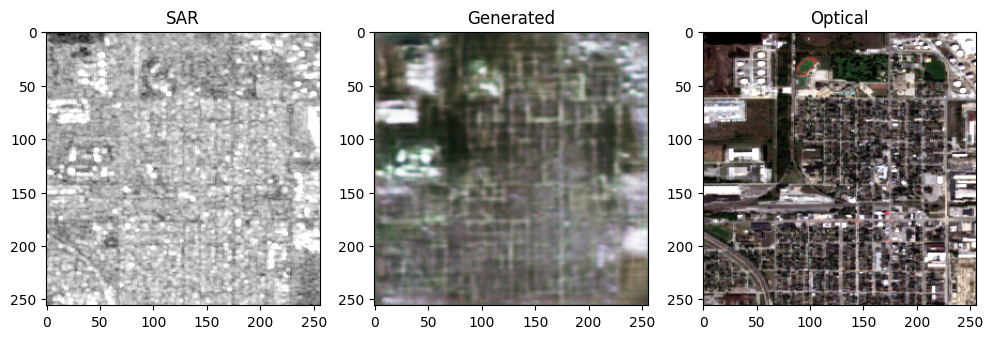


Epoch [022/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.350152 Loss_G: 36.513371 | Valid_D: 0.341939 Fake_D: 0.358364 | BCE_G: 1.627750 Img_G: 0.237665 Grd_G: 0.111191
Batch [050/125] | Loss_D: 0.401689 Loss_G: 32.633728 | Valid_D: 0.451051 Fake_D: 0.352326 | BCE_G: 1.730084 Img_G: 0.215793 Grd_G: 0.093243
Batch [075/125] | Loss_D: 0.393935 Loss_G: 33.713989 | Valid_D: 0.429946 Fake_D: 0.357924 | BCE_G: 1.555561 Img_G: 0.222807 Grd_G: 0.098777
Batch [100/125] | Loss_D: 0.415002 Loss_G: 37.872837 | Valid_D: 0.342838 Fake_D: 0.487165 | BCE_G: 1.477089 Img_G: 0.247984 Grd_G: 0.115974
Batch [125/125] | Loss_D: 0.548566 Loss_G: 34.549160 | Valid_D: 0.726136 Fake_D: 0.370997 | BCE_G: 1.624110 Img_G: 0.231187 Grd_G: 0.098063
----------------------------------------------------
Epoch [022/100] | Loss_D: 0.389170 Loss_G: 35.724368 (Epoch Average)


Epoch [023/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.390728 Lo

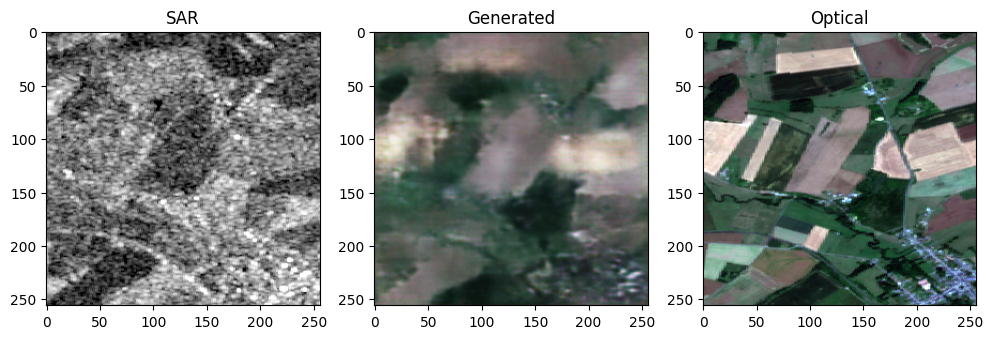


Epoch [025/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.363969 Loss_G: 34.930634 | Valid_D: 0.380742 Fake_D: 0.347196 | BCE_G: 1.754684 Img_G: 0.225575 Grd_G: 0.106185
Batch [050/125] | Loss_D: 0.362718 Loss_G: 33.251839 | Valid_D: 0.334090 Fake_D: 0.391346 | BCE_G: 1.378392 Img_G: 0.220556 Grd_G: 0.098178
Batch [075/125] | Loss_D: 0.338762 Loss_G: 33.786617 | Valid_D: 0.336878 Fake_D: 0.340646 | BCE_G: 1.831284 Img_G: 0.212823 Grd_G: 0.106730
Batch [100/125] | Loss_D: 0.358881 Loss_G: 34.791878 | Valid_D: 0.340245 Fake_D: 0.377517 | BCE_G: 1.558006 Img_G: 0.226355 Grd_G: 0.105983
Batch [125/125] | Loss_D: 0.365268 Loss_G: 33.759171 | Valid_D: 0.334088 Fake_D: 0.396449 | BCE_G: 1.523064 Img_G: 0.216455 Grd_G: 0.105906
----------------------------------------------------
Epoch [025/100] | Loss_D: 0.401574 Loss_G: 34.130902 (Epoch Average)


Epoch [026/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.351981 Lo

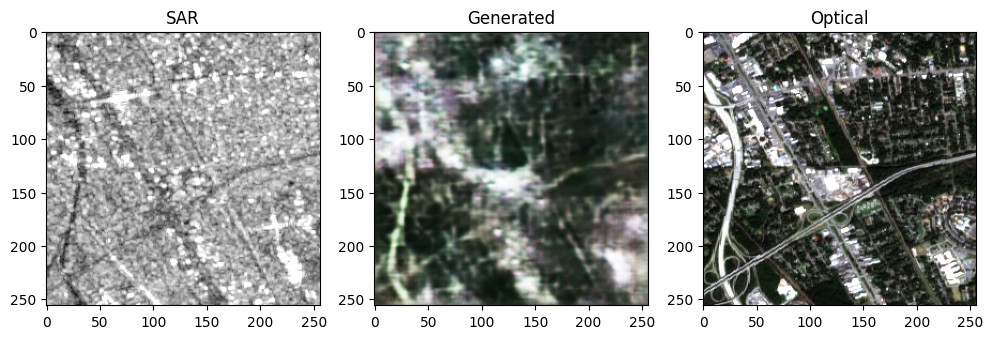


Epoch [028/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.348158 Loss_G: 37.135426 | Valid_D: 0.362517 Fake_D: 0.333800 | BCE_G: 2.084093 Img_G: 0.234978 Grd_G: 0.115535
Batch [050/125] | Loss_D: 0.370341 Loss_G: 31.018658 | Valid_D: 0.403217 Fake_D: 0.337465 | BCE_G: 1.910537 Img_G: 0.191431 Grd_G: 0.099650
Batch [075/125] | Loss_D: 0.358272 Loss_G: 32.448151 | Valid_D: 0.381828 Fake_D: 0.334716 | BCE_G: 2.083550 Img_G: 0.200280 Grd_G: 0.103366
Batch [100/125] | Loss_D: 0.405087 Loss_G: 35.232895 | Valid_D: 0.374451 Fake_D: 0.435722 | BCE_G: 1.313861 Img_G: 0.227242 Grd_G: 0.111949
Batch [125/125] | Loss_D: 0.456625 Loss_G: 33.843819 | Valid_D: 0.416995 Fake_D: 0.496256 | BCE_G: 1.296895 Img_G: 0.220409 Grd_G: 0.105060
----------------------------------------------------
Epoch [028/100] | Loss_D: 0.412851 Loss_G: 32.821438 (Epoch Average)


Epoch [029/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.359224 Lo

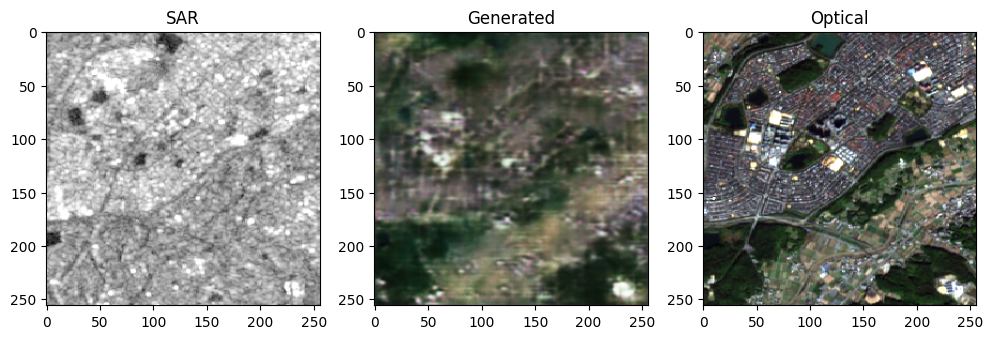


Epoch [031/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.375768 Loss_G: 33.648506 | Valid_D: 0.417276 Fake_D: 0.334261 | BCE_G: 2.122777 Img_G: 0.200348 Grd_G: 0.114909
Batch [050/125] | Loss_D: 0.343334 Loss_G: 37.171127 | Valid_D: 0.338183 Fake_D: 0.348485 | BCE_G: 1.857500 Img_G: 0.228518 Grd_G: 0.124619
Batch [075/125] | Loss_D: 0.381361 Loss_G: 31.072380 | Valid_D: 0.369427 Fake_D: 0.393296 | BCE_G: 1.297377 Img_G: 0.194278 Grd_G: 0.103472
Batch [100/125] | Loss_D: 0.351548 Loss_G: 33.322247 | Valid_D: 0.342527 Fake_D: 0.360569 | BCE_G: 1.644806 Img_G: 0.207869 Grd_G: 0.108906
Batch [125/125] | Loss_D: 0.430232 Loss_G: 33.282433 | Valid_D: 0.488902 Fake_D: 0.371562 | BCE_G: 1.626558 Img_G: 0.208710 Grd_G: 0.107849
----------------------------------------------------
Epoch [031/100] | Loss_D: 0.435201 Loss_G: 32.040935 (Epoch Average)


Epoch [032/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.837534 Lo

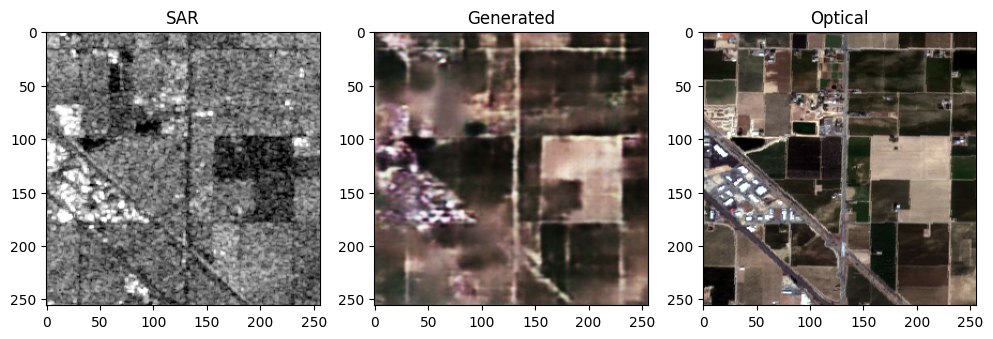


Epoch [034/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.364229 Loss_G: 30.121040 | Valid_D: 0.372862 Fake_D: 0.355597 | BCE_G: 1.410336 Img_G: 0.188549 Grd_G: 0.098558
Batch [050/125] | Loss_D: 0.375018 Loss_G: 31.423937 | Valid_D: 0.339819 Fake_D: 0.410217 | BCE_G: 1.513100 Img_G: 0.195538 Grd_G: 0.103570
Batch [075/125] | Loss_D: 0.502291 Loss_G: 28.073105 | Valid_D: 0.571072 Fake_D: 0.433509 | BCE_G: 1.003862 Img_G: 0.181827 Grd_G: 0.088866
Batch [100/125] | Loss_D: 0.391129 Loss_G: 34.385166 | Valid_D: 0.341935 Fake_D: 0.440323 | BCE_G: 1.357322 Img_G: 0.213590 Grd_G: 0.116689
Batch [125/125] | Loss_D: 0.374030 Loss_G: 35.355221 | Valid_D: 0.341768 Fake_D: 0.406293 | BCE_G: 1.541635 Img_G: 0.220890 Grd_G: 0.117246
----------------------------------------------------
Epoch [034/100] | Loss_D: 0.439449 Loss_G: 31.416881 (Epoch Average)


Epoch [035/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.663929 Lo

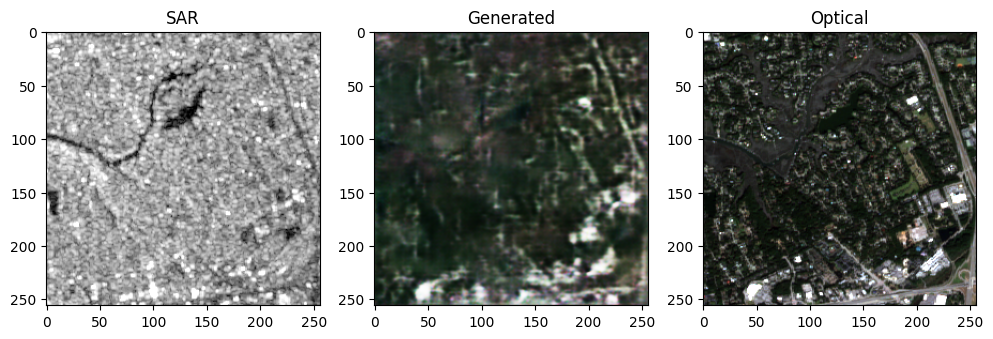


Epoch [037/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.954013 Loss_G: 29.527077 | Valid_D: 1.555380 Fake_D: 0.352646 | BCE_G: 1.649099 Img_G: 0.185323 Grd_G: 0.093457
Batch [050/125] | Loss_D: 0.535153 Loss_G: 28.774582 | Valid_D: 0.569620 Fake_D: 0.500686 | BCE_G: 1.010199 Img_G: 0.181337 Grd_G: 0.096307
Batch [075/125] | Loss_D: 0.769199 Loss_G: 29.324430 | Valid_D: 1.196416 Fake_D: 0.341983 | BCE_G: 1.608467 Img_G: 0.181524 Grd_G: 0.095635
Batch [100/125] | Loss_D: 0.472230 Loss_G: 32.270729 | Valid_D: 0.358219 Fake_D: 0.586241 | BCE_G: 1.099288 Img_G: 0.193622 Grd_G: 0.118093
Batch [125/125] | Loss_D: 0.385751 Loss_G: 30.799480 | Valid_D: 0.401891 Fake_D: 0.369612 | BCE_G: 1.523726 Img_G: 0.183798 Grd_G: 0.108959
----------------------------------------------------
Epoch [037/100] | Loss_D: 0.445053 Loss_G: 30.374457 (Epoch Average)


Epoch [038/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.393522 Lo

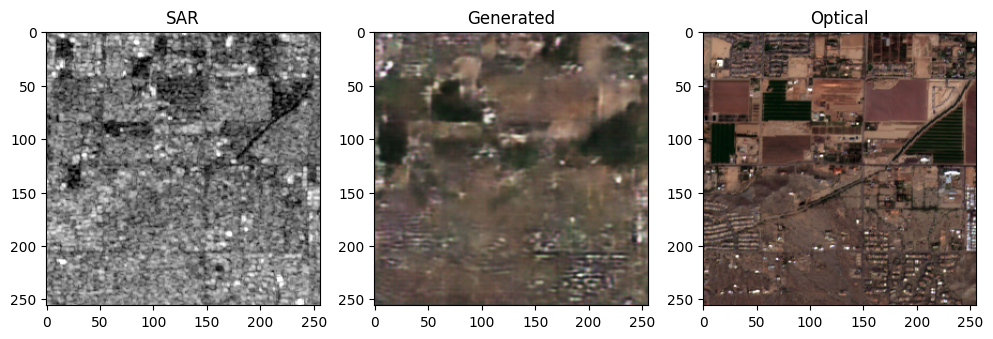


Epoch [040/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.432752 Loss_G: 29.124760 | Valid_D: 0.504998 Fake_D: 0.360506 | BCE_G: 1.590149 Img_G: 0.171075 Grd_G: 0.104271
Batch [050/125] | Loss_D: 0.348323 Loss_G: 30.377838 | Valid_D: 0.350413 Fake_D: 0.346232 | BCE_G: 1.785400 Img_G: 0.174771 Grd_G: 0.111153
Batch [075/125] | Loss_D: 0.398337 Loss_G: 27.931730 | Valid_D: 0.451948 Fake_D: 0.344727 | BCE_G: 1.693794 Img_G: 0.163768 Grd_G: 0.098611
Batch [100/125] | Loss_D: 0.344711 Loss_G: 30.881691 | Valid_D: 0.348290 Fake_D: 0.341132 | BCE_G: 1.958053 Img_G: 0.179404 Grd_G: 0.109833
Batch [125/125] | Loss_D: 0.354798 Loss_G: 31.818829 | Valid_D: 0.342328 Fake_D: 0.367268 | BCE_G: 1.766962 Img_G: 0.185029 Grd_G: 0.115489
----------------------------------------------------
Epoch [040/100] | Loss_D: 0.458630 Loss_G: 29.566885 (Epoch Average)


Epoch [041/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.781667 Lo

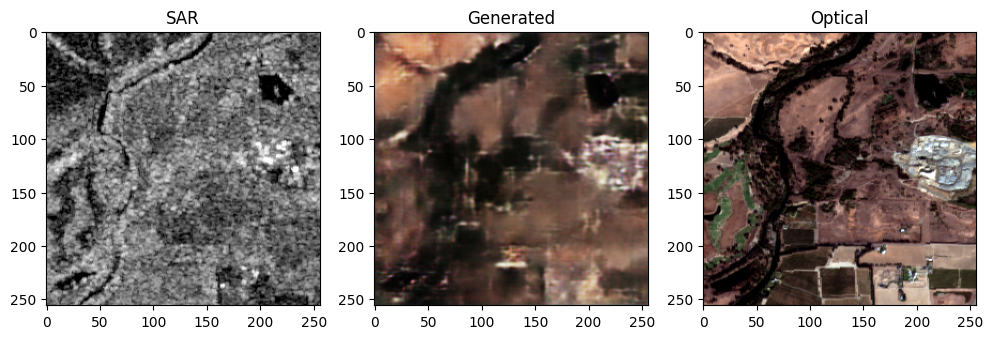


Epoch [043/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.392710 Loss_G: 29.060825 | Valid_D: 0.449790 Fake_D: 0.335631 | BCE_G: 2.321846 Img_G: 0.165482 Grd_G: 0.101908
Batch [050/125] | Loss_D: 0.707805 Loss_G: 26.827017 | Valid_D: 1.077877 Fake_D: 0.337733 | BCE_G: 1.991015 Img_G: 0.161658 Grd_G: 0.086702
Batch [075/125] | Loss_D: 0.467769 Loss_G: 31.046200 | Valid_D: 0.350912 Fake_D: 0.584626 | BCE_G: 0.998829 Img_G: 0.183432 Grd_G: 0.117042
Batch [100/125] | Loss_D: 0.422053 Loss_G: 28.455208 | Valid_D: 0.486376 Fake_D: 0.357731 | BCE_G: 1.560464 Img_G: 0.164344 Grd_G: 0.104603
Batch [125/125] | Loss_D: 0.391814 Loss_G: 30.827990 | Valid_D: 0.406379 Fake_D: 0.377250 | BCE_G: 1.455456 Img_G: 0.179189 Grd_G: 0.114536
----------------------------------------------------
Epoch [043/100] | Loss_D: 0.482220 Loss_G: 29.129648 (Epoch Average)


Epoch [044/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.510160 Lo

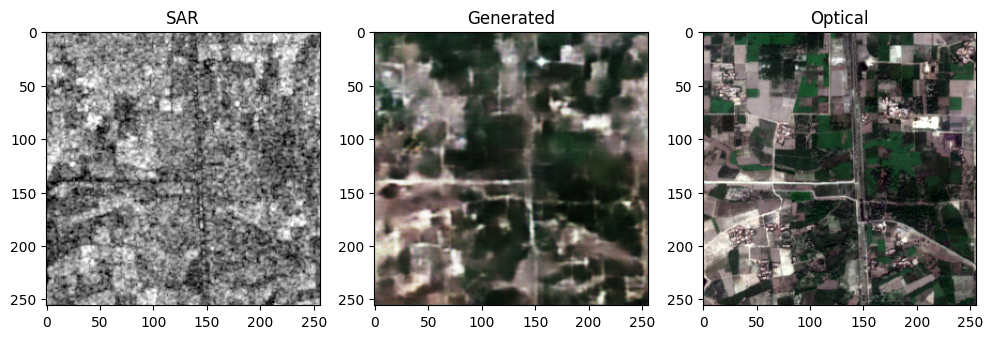


Epoch [046/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.437196 Loss_G: 28.172005 | Valid_D: 0.338571 Fake_D: 0.535821 | BCE_G: 1.069965 Img_G: 0.162626 Grd_G: 0.108395
Batch [050/125] | Loss_D: 0.404481 Loss_G: 28.023762 | Valid_D: 0.370166 Fake_D: 0.438797 | BCE_G: 1.095902 Img_G: 0.163561 Grd_G: 0.105718
Batch [075/125] | Loss_D: 0.582982 Loss_G: 25.679262 | Valid_D: 0.527642 Fake_D: 0.638322 | BCE_G: 1.025472 Img_G: 0.152390 Grd_G: 0.094147
Batch [100/125] | Loss_D: 0.692118 Loss_G: 25.815920 | Valid_D: 1.014446 Fake_D: 0.369790 | BCE_G: 0.997747 Img_G: 0.154553 Grd_G: 0.093629
Batch [125/125] | Loss_D: 0.354415 Loss_G: 29.994057 | Valid_D: 0.368270 Fake_D: 0.340560 | BCE_G: 1.818492 Img_G: 0.168462 Grd_G: 0.113294
----------------------------------------------------
Epoch [046/100] | Loss_D: 0.480224 Loss_G: 28.394049 (Epoch Average)


Epoch [047/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.390935 Lo

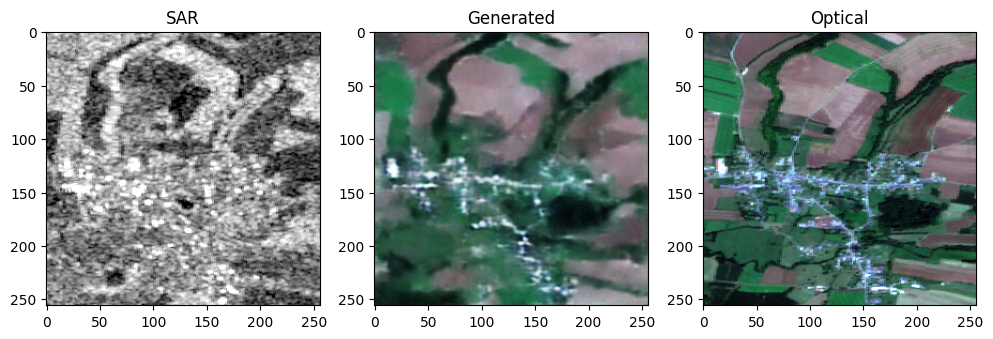


Epoch [049/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.373984 Loss_G: 28.081860 | Valid_D: 0.376835 Fake_D: 0.371132 | BCE_G: 1.468443 Img_G: 0.157973 Grd_G: 0.108161
Batch [050/125] | Loss_D: 0.543195 Loss_G: 26.006996 | Valid_D: 0.366814 Fake_D: 0.719575 | BCE_G: 0.896277 Img_G: 0.151608 Grd_G: 0.099499
Batch [075/125] | Loss_D: 0.430162 Loss_G: 28.966200 | Valid_D: 0.334010 Fake_D: 0.526315 | BCE_G: 1.128862 Img_G: 0.168068 Grd_G: 0.110305
Batch [100/125] | Loss_D: 0.406464 Loss_G: 29.315804 | Valid_D: 0.345551 Fake_D: 0.467377 | BCE_G: 1.216891 Img_G: 0.172226 Grd_G: 0.108763
Batch [125/125] | Loss_D: 0.527539 Loss_G: 27.408241 | Valid_D: 0.618486 Fake_D: 0.436592 | BCE_G: 1.051302 Img_G: 0.158957 Grd_G: 0.104613
----------------------------------------------------
Epoch [049/100] | Loss_D: 0.473876 Loss_G: 27.829608 (Epoch Average)


Epoch [050/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.823424 Lo

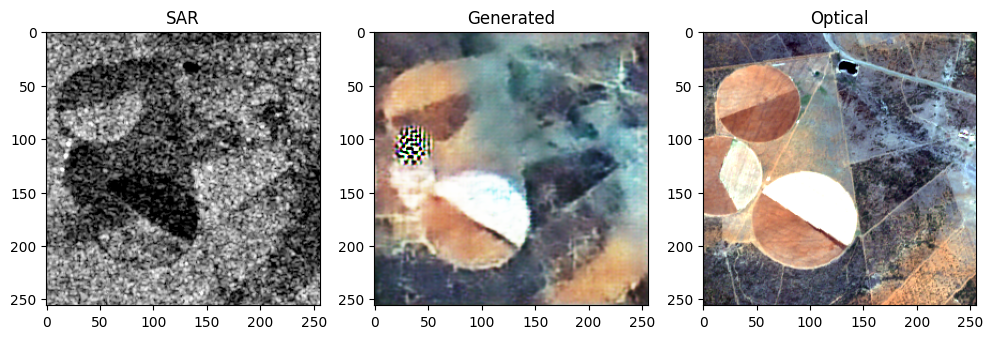


Epoch [052/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.617580 Loss_G: 24.283619 | Valid_D: 0.847820 Fake_D: 0.387339 | BCE_G: 1.166684 Img_G: 0.140779 Grd_G: 0.090390
Batch [050/125] | Loss_D: 0.419896 Loss_G: 29.308109 | Valid_D: 0.499931 Fake_D: 0.339861 | BCE_G: 1.768667 Img_G: 0.165828 Grd_G: 0.109566
Batch [075/125] | Loss_D: 0.455109 Loss_G: 29.027565 | Valid_D: 0.342830 Fake_D: 0.567387 | BCE_G: 1.044641 Img_G: 0.167116 Grd_G: 0.112713
Batch [100/125] | Loss_D: 0.383277 Loss_G: 28.124054 | Valid_D: 0.431451 Fake_D: 0.335102 | BCE_G: 1.811601 Img_G: 0.155987 Grd_G: 0.107137
Batch [125/125] | Loss_D: 0.595515 Loss_G: 27.116653 | Valid_D: 0.337196 Fake_D: 0.853835 | BCE_G: 0.863054 Img_G: 0.156218 Grd_G: 0.106318
----------------------------------------------------
Epoch [052/100] | Loss_D: 0.499419 Loss_G: 27.431570 (Epoch Average)


Epoch [053/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.382043 Lo

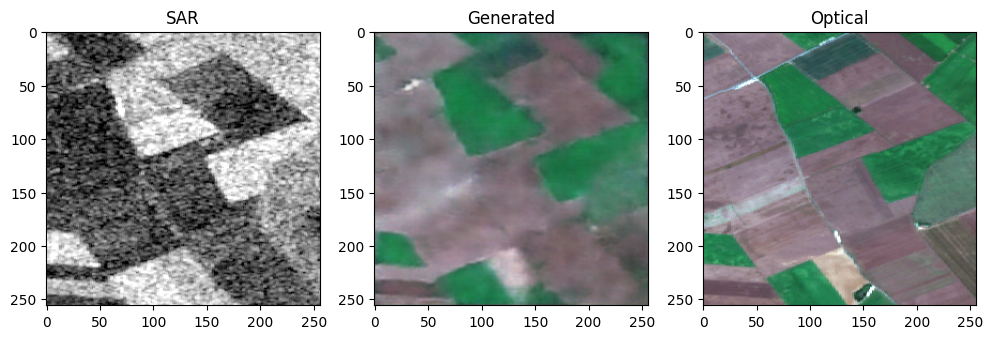


Epoch [055/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.461481 Loss_G: 25.978867 | Valid_D: 0.549111 Fake_D: 0.373850 | BCE_G: 1.259959 Img_G: 0.146247 Grd_G: 0.100942
Batch [050/125] | Loss_D: 0.633427 Loss_G: 25.923544 | Valid_D: 0.927518 Fake_D: 0.339336 | BCE_G: 1.800718 Img_G: 0.145730 Grd_G: 0.095498
Batch [075/125] | Loss_D: 0.427286 Loss_G: 27.495857 | Valid_D: 0.434723 Fake_D: 0.419849 | BCE_G: 1.320538 Img_G: 0.155000 Grd_G: 0.106753
Batch [100/125] | Loss_D: 0.603054 Loss_G: 26.180473 | Valid_D: 0.591987 Fake_D: 0.614121 | BCE_G: 0.856564 Img_G: 0.156670 Grd_G: 0.096569
Batch [125/125] | Loss_D: 0.475986 Loss_G: 27.403151 | Valid_D: 0.375436 Fake_D: 0.576537 | BCE_G: 1.208904 Img_G: 0.157183 Grd_G: 0.104760
----------------------------------------------------
Epoch [055/100] | Loss_D: 0.483791 Loss_G: 26.990375 (Epoch Average)


Epoch [056/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.408055 Lo

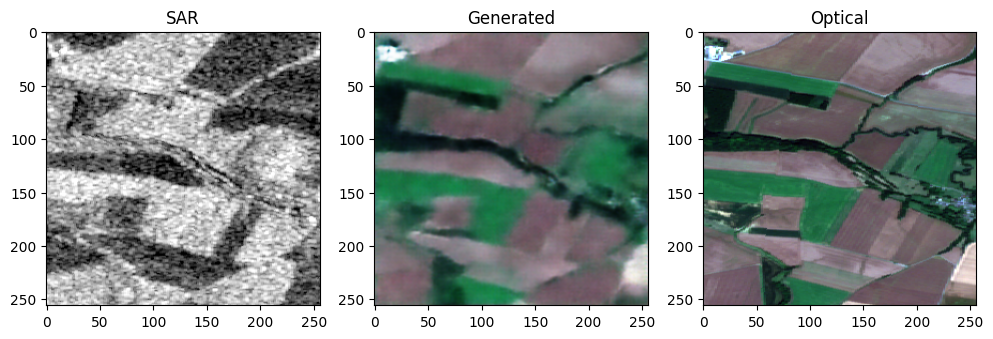


Epoch [058/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.398296 Loss_G: 26.101498 | Valid_D: 0.348255 Fake_D: 0.448338 | BCE_G: 1.190771 Img_G: 0.145138 Grd_G: 0.103970
Batch [050/125] | Loss_D: 0.502528 Loss_G: 24.068241 | Valid_D: 0.333664 Fake_D: 0.671393 | BCE_G: 0.926941 Img_G: 0.138519 Grd_G: 0.092894
Batch [075/125] | Loss_D: 0.407492 Loss_G: 26.717857 | Valid_D: 0.476800 Fake_D: 0.338184 | BCE_G: 1.821482 Img_G: 0.145772 Grd_G: 0.103192
Batch [100/125] | Loss_D: 0.481917 Loss_G: 25.648212 | Valid_D: 0.593762 Fake_D: 0.370071 | BCE_G: 1.217524 Img_G: 0.144561 Grd_G: 0.099746
Batch [125/125] | Loss_D: 0.500726 Loss_G: 26.895510 | Valid_D: 0.339897 Fake_D: 0.661555 | BCE_G: 0.986938 Img_G: 0.153944 Grd_G: 0.105142
----------------------------------------------------
Epoch [058/100] | Loss_D: 0.484927 Loss_G: 26.376652 (Epoch Average)


Epoch [059/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.401753 Lo

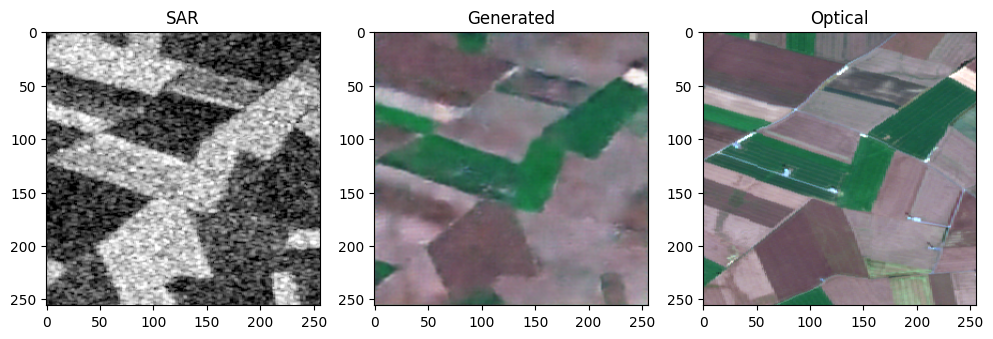


Epoch [061/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.498032 Loss_G: 25.910084 | Valid_D: 0.338375 Fake_D: 0.657690 | BCE_G: 0.894419 Img_G: 0.145157 Grd_G: 0.104999
Batch [050/125] | Loss_D: 0.407024 Loss_G: 26.717113 | Valid_D: 0.347526 Fake_D: 0.466523 | BCE_G: 1.174663 Img_G: 0.152646 Grd_G: 0.102778
Batch [075/125] | Loss_D: 0.547397 Loss_G: 22.635338 | Valid_D: 0.496483 Fake_D: 0.598311 | BCE_G: 0.886997 Img_G: 0.129866 Grd_G: 0.087618
Batch [100/125] | Loss_D: 0.529242 Loss_G: 24.413723 | Valid_D: 0.400553 Fake_D: 0.657932 | BCE_G: 0.957332 Img_G: 0.140235 Grd_G: 0.094329
Batch [125/125] | Loss_D: 0.343883 Loss_G: 27.339802 | Valid_D: 0.337079 Fake_D: 0.350687 | BCE_G: 1.668854 Img_G: 0.147319 Grd_G: 0.109390
----------------------------------------------------
Epoch [061/100] | Loss_D: 0.485742 Loss_G: 26.019986 (Epoch Average)


Epoch [062/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.473663 Lo

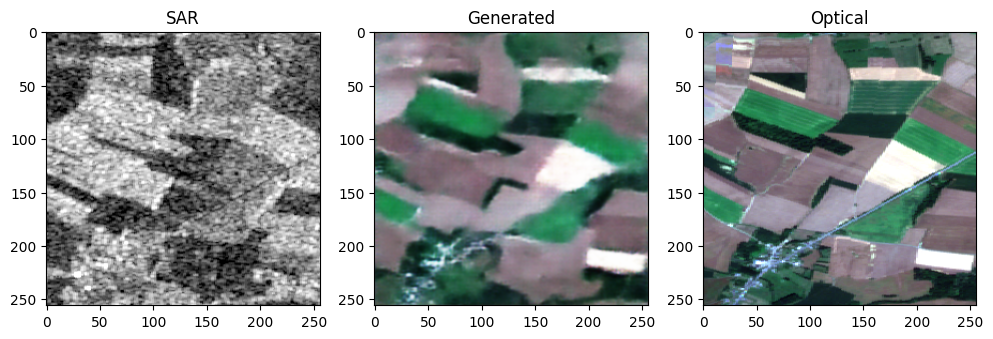


Epoch [064/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.730209 Loss_G: 23.979027 | Valid_D: 1.095909 Fake_D: 0.364510 | BCE_G: 1.334359 Img_G: 0.134098 Grd_G: 0.092349
Batch [050/125] | Loss_D: 0.834506 Loss_G: 22.613340 | Valid_D: 0.780271 Fake_D: 0.888742 | BCE_G: 0.629148 Img_G: 0.139020 Grd_G: 0.080822
Batch [075/125] | Loss_D: 0.373958 Loss_G: 25.824295 | Valid_D: 0.400185 Fake_D: 0.347731 | BCE_G: 1.738326 Img_G: 0.140218 Grd_G: 0.100642
Batch [100/125] | Loss_D: 0.547538 Loss_G: 25.979359 | Valid_D: 0.735362 Fake_D: 0.359713 | BCE_G: 1.401784 Img_G: 0.145464 Grd_G: 0.100312
Batch [125/125] | Loss_D: 0.488491 Loss_G: 28.795347 | Valid_D: 0.625372 Fake_D: 0.351611 | BCE_G: 2.115366 Img_G: 0.156621 Grd_G: 0.110179
----------------------------------------------------
Epoch [064/100] | Loss_D: 0.492863 Loss_G: 25.888770 (Epoch Average)


Epoch [065/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.412216 Lo

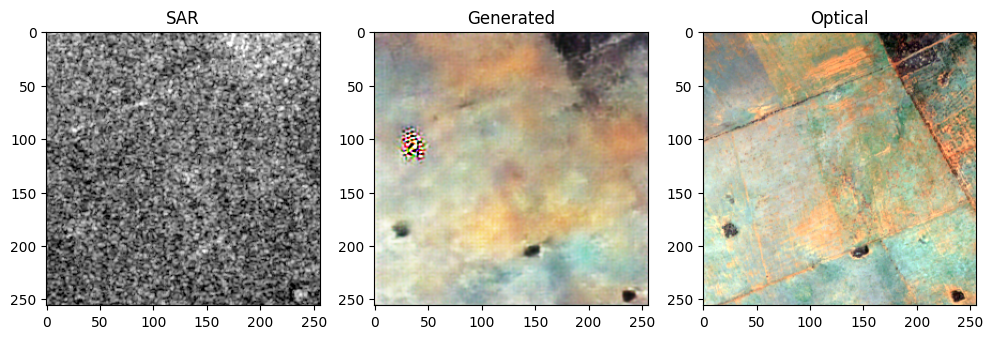


Epoch [067/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.470988 Loss_G: 24.397266 | Valid_D: 0.333608 Fake_D: 0.608368 | BCE_G: 0.931325 Img_G: 0.138101 Grd_G: 0.096558
Batch [050/125] | Loss_D: 0.406542 Loss_G: 24.939167 | Valid_D: 0.390459 Fake_D: 0.422626 | BCE_G: 1.208871 Img_G: 0.135806 Grd_G: 0.101497
Batch [075/125] | Loss_D: 0.399421 Loss_G: 27.609982 | Valid_D: 0.334055 Fake_D: 0.464786 | BCE_G: 1.330015 Img_G: 0.149986 Grd_G: 0.112814
Batch [100/125] | Loss_D: 0.486931 Loss_G: 27.725704 | Valid_D: 0.337139 Fake_D: 0.636724 | BCE_G: 0.846191 Img_G: 0.151460 Grd_G: 0.117335
Batch [125/125] | Loss_D: 0.557960 Loss_G: 24.876858 | Valid_D: 0.780647 Fake_D: 0.335274 | BCE_G: 1.740484 Img_G: 0.136637 Grd_G: 0.094726
----------------------------------------------------
Epoch [067/100] | Loss_D: 0.495775 Loss_G: 25.499813 (Epoch Average)


Epoch [068/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.411619 Lo

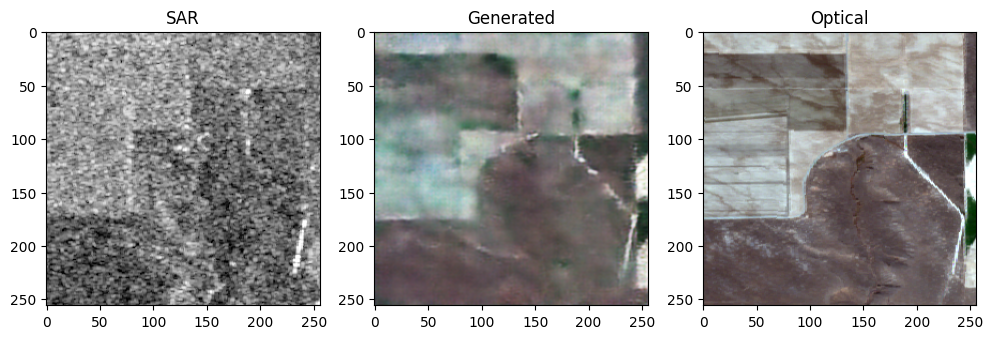


Epoch [070/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.549493 Loss_G: 24.076542 | Valid_D: 0.745640 Fake_D: 0.353346 | BCE_G: 1.487332 Img_G: 0.139245 Grd_G: 0.086647
Batch [050/125] | Loss_D: 0.780969 Loss_G: 25.366459 | Valid_D: 1.210428 Fake_D: 0.351509 | BCE_G: 1.686264 Img_G: 0.144307 Grd_G: 0.092495
Batch [075/125] | Loss_D: 0.461268 Loss_G: 25.347626 | Valid_D: 0.488278 Fake_D: 0.434258 | BCE_G: 1.245025 Img_G: 0.140559 Grd_G: 0.100467
Batch [100/125] | Loss_D: 0.673573 Loss_G: 22.635925 | Valid_D: 0.951920 Fake_D: 0.395227 | BCE_G: 1.143196 Img_G: 0.126342 Grd_G: 0.088585
Batch [125/125] | Loss_D: 0.722508 Loss_G: 25.775890 | Valid_D: 0.340613 Fake_D: 1.104404 | BCE_G: 0.672300 Img_G: 0.143801 Grd_G: 0.107235
----------------------------------------------------
Epoch [070/100] | Loss_D: 0.502636 Loss_G: 25.064024 (Epoch Average)


Epoch [071/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.435527 Lo

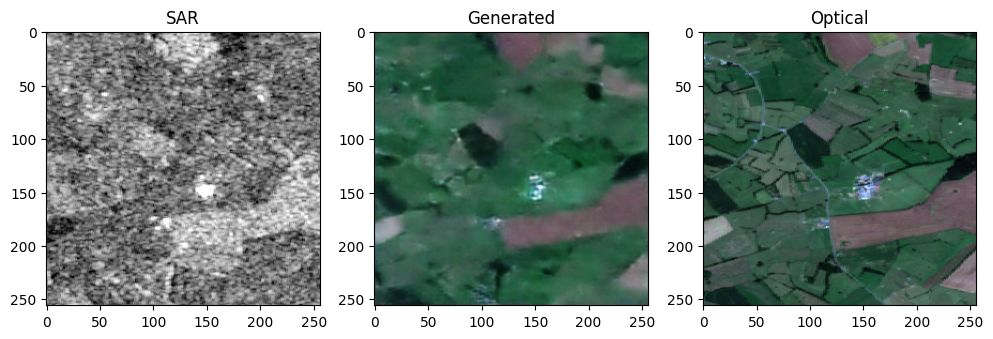


Epoch [073/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.903008 Loss_G: 23.127275 | Valid_D: 1.466195 Fake_D: 0.339821 | BCE_G: 1.825516 Img_G: 0.125899 Grd_G: 0.087118
Batch [050/125] | Loss_D: 0.393435 Loss_G: 26.006865 | Valid_D: 0.355499 Fake_D: 0.431372 | BCE_G: 1.305543 Img_G: 0.139276 Grd_G: 0.107737
Batch [075/125] | Loss_D: 0.406883 Loss_G: 24.542936 | Valid_D: 0.403746 Fake_D: 0.410021 | BCE_G: 1.285120 Img_G: 0.133507 Grd_G: 0.099071
Batch [100/125] | Loss_D: 0.479959 Loss_G: 25.035877 | Valid_D: 0.408669 Fake_D: 0.551250 | BCE_G: 1.007629 Img_G: 0.139407 Grd_G: 0.100876
Batch [125/125] | Loss_D: 0.477995 Loss_G: 24.524441 | Valid_D: 0.482234 Fake_D: 0.473757 | BCE_G: 1.070943 Img_G: 0.136920 Grd_G: 0.097615
----------------------------------------------------
Epoch [073/100] | Loss_D: 0.496060 Loss_G: 24.841263 (Epoch Average)


Epoch [074/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.548867 Lo

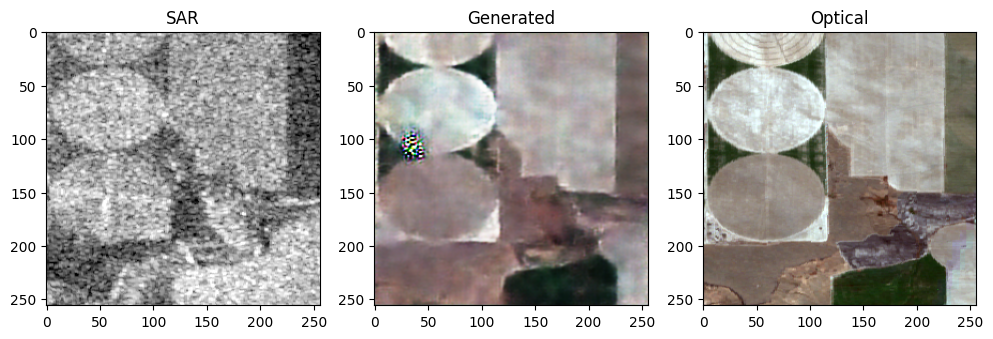


Epoch [076/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.458460 Loss_G: 23.937784 | Valid_D: 0.484856 Fake_D: 0.432065 | BCE_G: 1.217172 Img_G: 0.130060 Grd_G: 0.097146
Batch [050/125] | Loss_D: 0.427078 Loss_G: 25.159542 | Valid_D: 0.493441 Fake_D: 0.360715 | BCE_G: 1.497958 Img_G: 0.133656 Grd_G: 0.102960
Batch [075/125] | Loss_D: 0.437086 Loss_G: 24.405010 | Valid_D: 0.432774 Fake_D: 0.441397 | BCE_G: 1.189366 Img_G: 0.134382 Grd_G: 0.097775
Batch [100/125] | Loss_D: 0.399610 Loss_G: 25.653358 | Valid_D: 0.422070 Fake_D: 0.377151 | BCE_G: 1.472471 Img_G: 0.138869 Grd_G: 0.102940
Batch [125/125] | Loss_D: 0.518095 Loss_G: 23.760979 | Valid_D: 0.511908 Fake_D: 0.524281 | BCE_G: 0.942551 Img_G: 0.132328 Grd_G: 0.095857
----------------------------------------------------
Epoch [076/100] | Loss_D: 0.501966 Loss_G: 24.811948 (Epoch Average)


Epoch [077/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.422243 Lo

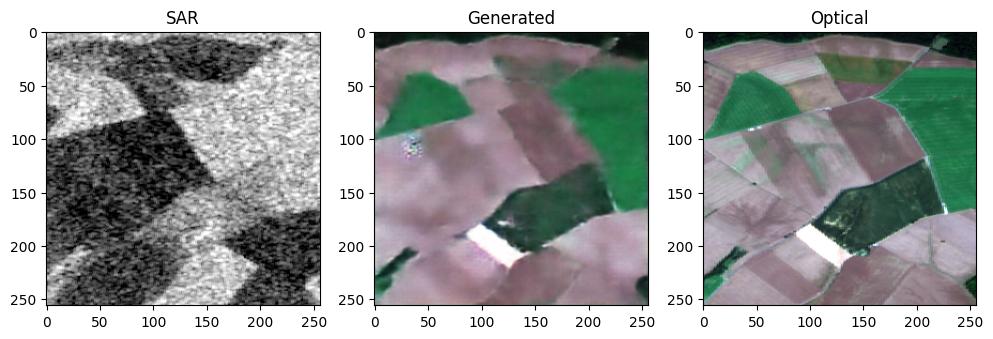


Epoch [079/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.384928 Loss_G: 24.224888 | Valid_D: 0.404960 Fake_D: 0.364895 | BCE_G: 1.504669 Img_G: 0.127635 Grd_G: 0.099568
Batch [050/125] | Loss_D: 0.597763 Loss_G: 21.479996 | Valid_D: 0.813402 Fake_D: 0.382123 | BCE_G: 1.281610 Img_G: 0.116144 Grd_G: 0.085840
Batch [075/125] | Loss_D: 0.548240 Loss_G: 22.424440 | Valid_D: 0.544535 Fake_D: 0.551946 | BCE_G: 0.983827 Img_G: 0.121999 Grd_G: 0.092407
Batch [100/125] | Loss_D: 0.661485 Loss_G: 24.554501 | Valid_D: 0.978542 Fake_D: 0.344427 | BCE_G: 2.187776 Img_G: 0.125946 Grd_G: 0.097722
Batch [125/125] | Loss_D: 0.800469 Loss_G: 23.541977 | Valid_D: 1.237868 Fake_D: 0.363070 | BCE_G: 1.461998 Img_G: 0.130583 Grd_G: 0.090217
----------------------------------------------------
Epoch [079/100] | Loss_D: 0.500648 Loss_G: 24.347004 (Epoch Average)


Epoch [080/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.589766 Lo

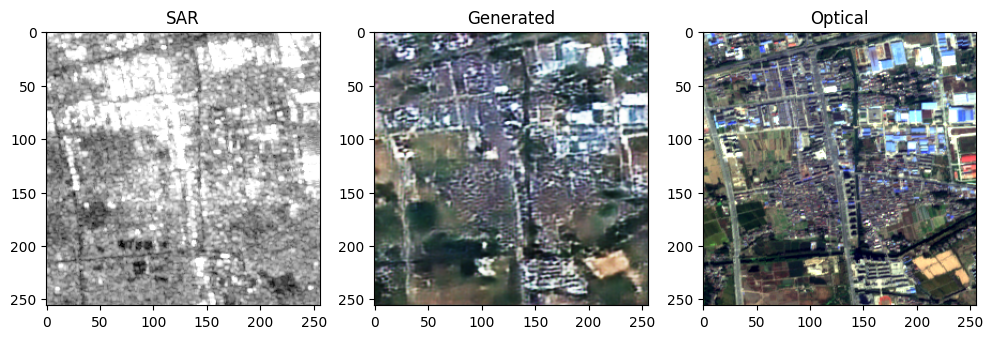


Epoch [082/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.484338 Loss_G: 23.419231 | Valid_D: 0.442375 Fake_D: 0.526302 | BCE_G: 0.970659 Img_G: 0.126599 Grd_G: 0.097887
Batch [050/125] | Loss_D: 0.410769 Loss_G: 26.490116 | Valid_D: 0.350837 Fake_D: 0.470700 | BCE_G: 1.462127 Img_G: 0.139873 Grd_G: 0.110407
Batch [075/125] | Loss_D: 0.451431 Loss_G: 22.275455 | Valid_D: 0.382023 Fake_D: 0.520839 | BCE_G: 0.993392 Img_G: 0.118980 Grd_G: 0.093841
Batch [100/125] | Loss_D: 0.498927 Loss_G: 23.223980 | Valid_D: 0.335194 Fake_D: 0.662659 | BCE_G: 1.010822 Img_G: 0.127441 Grd_G: 0.094690
Batch [125/125] | Loss_D: 0.473964 Loss_G: 21.855850 | Valid_D: 0.531164 Fake_D: 0.416764 | BCE_G: 1.059140 Img_G: 0.119186 Grd_G: 0.088781
----------------------------------------------------
Epoch [082/100] | Loss_D: 0.518118 Loss_G: 24.132057 (Epoch Average)


Epoch [083/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.600562 Lo

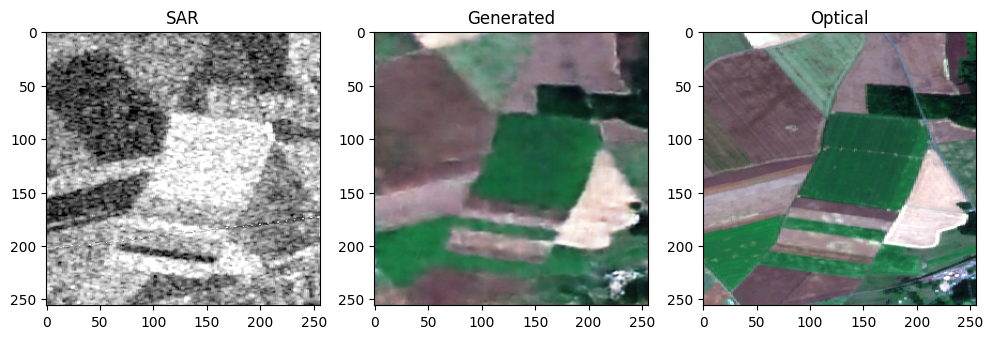


Epoch [085/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.577359 Loss_G: 26.882484 | Valid_D: 0.352827 Fake_D: 0.801892 | BCE_G: 0.807558 Img_G: 0.145120 Grd_G: 0.115630
Batch [050/125] | Loss_D: 0.391239 Loss_G: 25.452137 | Valid_D: 0.351397 Fake_D: 0.431080 | BCE_G: 1.315532 Img_G: 0.137824 Grd_G: 0.103542
Batch [075/125] | Loss_D: 0.407251 Loss_G: 24.601246 | Valid_D: 0.367000 Fake_D: 0.447503 | BCE_G: 1.192603 Img_G: 0.131718 Grd_G: 0.102369
Batch [100/125] | Loss_D: 0.819307 Loss_G: 22.118965 | Valid_D: 1.282609 Fake_D: 0.356005 | BCE_G: 1.526985 Img_G: 0.120250 Grd_G: 0.085669
Batch [125/125] | Loss_D: 0.424601 Loss_G: 24.491163 | Valid_D: 0.367962 Fake_D: 0.481239 | BCE_G: 1.138926 Img_G: 0.130369 Grd_G: 0.103154
----------------------------------------------------
Epoch [085/100] | Loss_D: 0.504940 Loss_G: 24.406717 (Epoch Average)


Epoch [086/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.379037 Lo

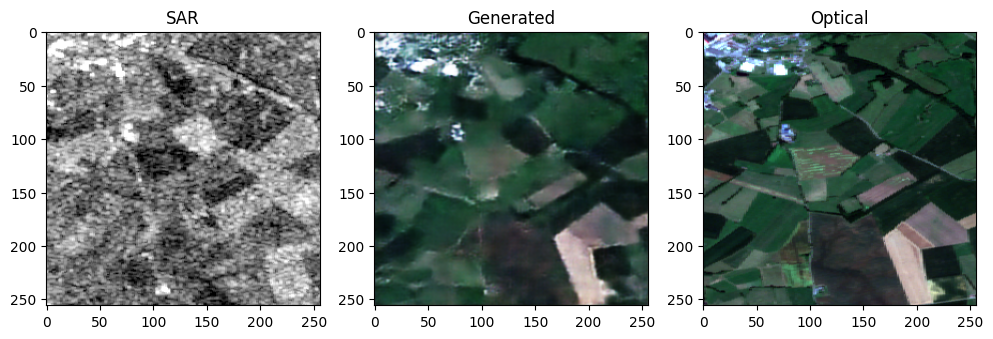


Epoch [088/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.389522 Loss_G: 25.162474 | Valid_D: 0.337325 Fake_D: 0.441720 | BCE_G: 1.208701 Img_G: 0.130997 Grd_G: 0.108541
Batch [050/125] | Loss_D: 0.401389 Loss_G: 24.059164 | Valid_D: 0.401471 Fake_D: 0.401308 | BCE_G: 1.230571 Img_G: 0.125666 Grd_G: 0.102619
Batch [075/125] | Loss_D: 0.495778 Loss_G: 23.579720 | Valid_D: 0.600953 Fake_D: 0.390603 | BCE_G: 1.505664 Img_G: 0.125040 Grd_G: 0.095701
Batch [100/125] | Loss_D: 0.516081 Loss_G: 23.269859 | Valid_D: 0.537712 Fake_D: 0.494450 | BCE_G: 1.075943 Img_G: 0.125624 Grd_G: 0.096315
Batch [125/125] | Loss_D: 0.423820 Loss_G: 21.908867 | Valid_D: 0.415952 Fake_D: 0.431688 | BCE_G: 1.085700 Img_G: 0.116141 Grd_G: 0.092090
----------------------------------------------------
Epoch [088/100] | Loss_D: 0.503287 Loss_G: 23.681531 (Epoch Average)


Epoch [089/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.467856 Lo

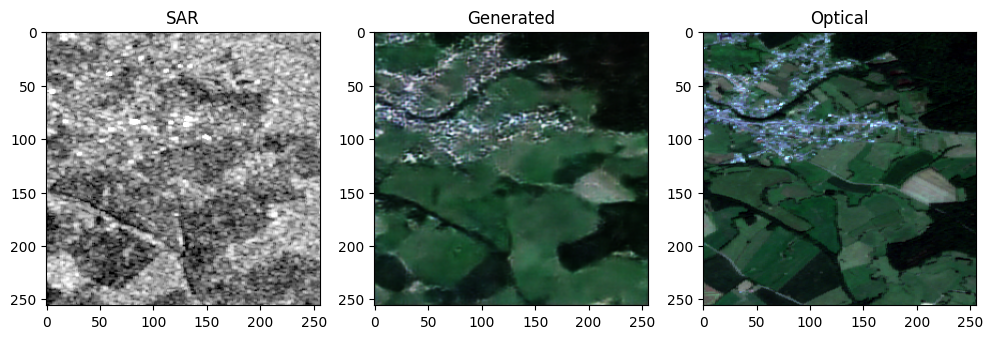


Epoch [091/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.370571 Loss_G: 23.499168 | Valid_D: 0.366135 Fake_D: 0.375006 | BCE_G: 1.514069 Img_G: 0.123016 Grd_G: 0.096835
Batch [050/125] | Loss_D: 0.568090 Loss_G: 21.614454 | Valid_D: 0.747606 Fake_D: 0.388574 | BCE_G: 1.229339 Img_G: 0.116295 Grd_G: 0.087556
Batch [075/125] | Loss_D: 0.535860 Loss_G: 24.810053 | Valid_D: 0.333340 Fake_D: 0.738381 | BCE_G: 0.841910 Img_G: 0.134544 Grd_G: 0.105137
Batch [100/125] | Loss_D: 0.474054 Loss_G: 23.719818 | Valid_D: 0.545110 Fake_D: 0.402999 | BCE_G: 1.218821 Img_G: 0.127142 Grd_G: 0.097868
Batch [125/125] | Loss_D: 0.743428 Loss_G: 22.095556 | Valid_D: 1.142152 Fake_D: 0.344704 | BCE_G: 1.521716 Img_G: 0.116730 Grd_G: 0.089008
----------------------------------------------------
Epoch [091/100] | Loss_D: 0.502999 Loss_G: 23.428477 (Epoch Average)


Epoch [092/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.342488 Lo

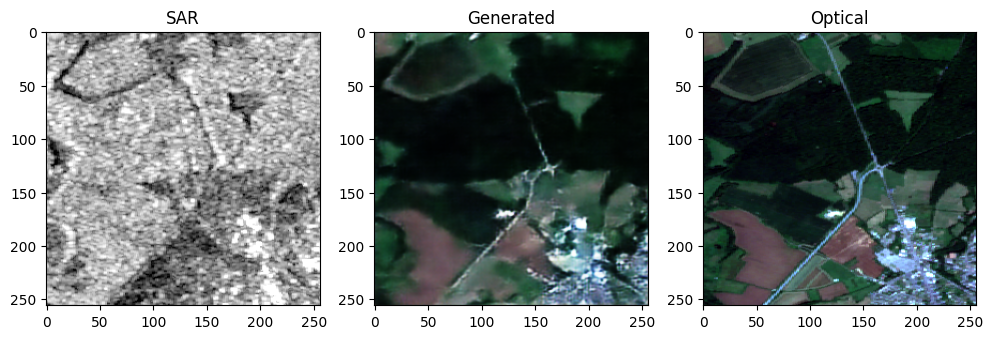


Epoch [094/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.617249 Loss_G: 24.071278 | Valid_D: 0.357163 Fake_D: 0.877336 | BCE_G: 0.727891 Img_G: 0.129903 Grd_G: 0.103531
Batch [050/125] | Loss_D: 0.527719 Loss_G: 24.168974 | Valid_D: 0.339225 Fake_D: 0.716214 | BCE_G: 0.894604 Img_G: 0.133275 Grd_G: 0.099468
Batch [075/125] | Loss_D: 0.440802 Loss_G: 22.885033 | Valid_D: 0.399436 Fake_D: 0.482169 | BCE_G: 1.216802 Img_G: 0.118576 Grd_G: 0.098106
Batch [100/125] | Loss_D: 0.473710 Loss_G: 21.310968 | Valid_D: 0.408210 Fake_D: 0.539210 | BCE_G: 0.999425 Img_G: 0.120571 Grd_G: 0.082544
Batch [125/125] | Loss_D: 0.376529 Loss_G: 27.184971 | Valid_D: 0.346932 Fake_D: 0.406127 | BCE_G: 1.432951 Img_G: 0.140942 Grd_G: 0.116579
----------------------------------------------------
Epoch [094/100] | Loss_D: 0.505228 Loss_G: 23.337476 (Epoch Average)


Epoch [095/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.537731 Lo

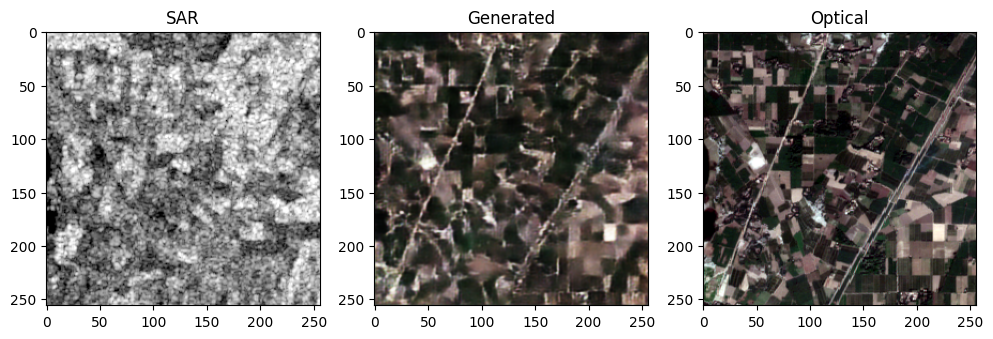


Epoch [097/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.502149 Loss_G: 22.720139 | Valid_D: 0.622586 Fake_D: 0.381713 | BCE_G: 1.244296 Img_G: 0.122881 Grd_G: 0.091877
Batch [050/125] | Loss_D: 0.562803 Loss_G: 23.589701 | Valid_D: 0.675544 Fake_D: 0.450061 | BCE_G: 1.061647 Img_G: 0.130028 Grd_G: 0.095252
Batch [075/125] | Loss_D: 0.493614 Loss_G: 22.635586 | Valid_D: 0.617076 Fake_D: 0.370152 | BCE_G: 1.343424 Img_G: 0.120837 Grd_G: 0.092085
Batch [100/125] | Loss_D: 0.726586 Loss_G: 21.267349 | Valid_D: 0.965857 Fake_D: 0.487315 | BCE_G: 0.893863 Img_G: 0.116291 Grd_G: 0.087444
Batch [125/125] | Loss_D: 0.388346 Loss_G: 23.267639 | Valid_D: 0.356165 Fake_D: 0.420528 | BCE_G: 1.281330 Img_G: 0.121253 Grd_G: 0.098610
----------------------------------------------------
Epoch [097/100] | Loss_D: 0.500643 Loss_G: 23.230461 (Epoch Average)


Epoch [098/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.508594 Lo

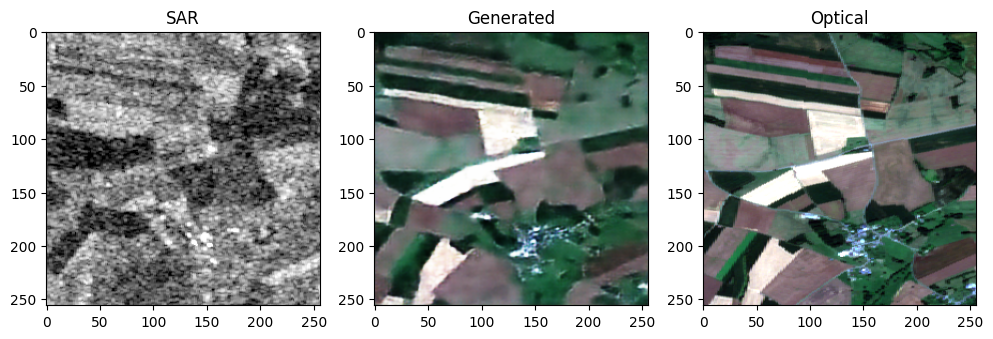


Epoch [100/100]
----------------------------------------------------
Batch [025/125] | Loss_D: 0.373546 Loss_G: 26.250059 | Valid_D: 0.334593 Fake_D: 0.412498 | BCE_G: 1.294921 Img_G: 0.139277 Grd_G: 0.110274
Batch [050/125] | Loss_D: 0.888045 Loss_G: 22.516911 | Valid_D: 1.442065 Fake_D: 0.334025 | BCE_G: 1.898026 Img_G: 0.115971 Grd_G: 0.090218
Batch [075/125] | Loss_D: 0.391116 Loss_G: 25.119648 | Valid_D: 0.413730 Fake_D: 0.368502 | BCE_G: 1.618862 Img_G: 0.130254 Grd_G: 0.104753
Batch [100/125] | Loss_D: 0.493328 Loss_G: 21.870493 | Valid_D: 0.629954 Fake_D: 0.356702 | BCE_G: 1.418634 Img_G: 0.113060 Grd_G: 0.091459
Batch [125/125] | Loss_D: 0.376082 Loss_G: 23.707663 | Valid_D: 0.339805 Fake_D: 0.412359 | BCE_G: 1.321728 Img_G: 0.123799 Grd_G: 0.100060
----------------------------------------------------
Epoch [100/100] | Loss_D: 0.499258 Loss_G: 23.017576 (Epoch Average)



In [20]:
START_EPOCH = 1
EPOCHS_TO_TRAIN = 100
LAST_EPOCH = START_EPOCH + EPOCHS_TO_TRAIN - 1
STEPS_PER_EPOCH = len(dataloader)
CHECKPOINT_DIR = '/content/drive/MyDrive/SAR_COLOR/checkpoints'
os.makedirs(CHECKPOINT_DIR, exist_ok=True)

loss_Gs = []
loss_Ds = []

for epoch in range(START_EPOCH, LAST_EPOCH + 1):

    generator.train()
    discriminator.train()

    epoch_loss_G = 0.0
    epoch_loss_D = 0.0

    # progress_bar = tqdm(enumerate(dataloader), desc=f'Epoch [{epoch:03}/{LAST_EPOCH:03}]', leave=True)

    print(f'\nEpoch [{epoch:03}/{LAST_EPOCH:03}]')
    print('-' * 52)

    # for i, (sar, col, _) in tqdm:
    for i, (sar, col, _) in enumerate(dataloader):

        sar = sar.to(DEVICE)
        col = col.to(DEVICE)

        fake = generator(sar)

        for param in discriminator.parameters():
            param.requires_grad = True

        optimizer_D.zero_grad()
        patch_valid = discriminator(sar, col)
        patch_fake = discriminator(sar, fake.detach())
        loss_D, valid_loss_D, fake_loss_D = discriminator_loss(patch_fake, patch_valid)
        loss_D.backward()
        # torch.nn.utils.clip_grad_norm_(discriminator.parameters(), max_norm=1.0)
        optimizer_D.step()

        for param in discriminator.parameters():
            param.requires_grad = False

        optimizer_G.zero_grad()
        patch_fake = discriminator(sar, fake)
        loss_G, bce_loss_G, img_loss_G, grd_loss_G = generator_loss(fake, col, patch_fake)
        loss_G.backward()
        # torch.nn.utils.clip_grad_norm_(generator.parameters(), max_norm=1.0)
        optimizer_G.step()

        # progress_bar.set_postfix({
        #     "G Loss": f'{loss_G.item():.6f}',
        #     "D Loss": f'{loss_D.item():.6f}',
        # })

        # if (i + 1) % 1 == 0:
        if (i + 1) % (STEPS_PER_EPOCH // 5) == 0:
            print(
                f"Batch [{i+1:03}/{STEPS_PER_EPOCH:03}] | "
                f"Loss_D: {loss_D.item():8.6f} Loss_G: {loss_G.item():8.6f} | "
                f"Valid_D: {valid_loss_D:8.6f} Fake_D: {fake_loss_D:8.6f} | "
                f"BCE_G: {bce_loss_G:8.6f} Img_G: {img_loss_G:8.6f} Grd_G: {grd_loss_G:8.6f}"
            )

        loss_Gs.append(loss_G.item())
        loss_Ds.append(loss_D.item())

        epoch_loss_D += loss_D.item()
        epoch_loss_G += loss_G.item()

    epoch_loss_D /= STEPS_PER_EPOCH
    epoch_loss_G /= STEPS_PER_EPOCH

    print('-' * 52)
    print(
        f"Epoch [{epoch:03}/{LAST_EPOCH:03}] | "
        f"Loss_D: {epoch_loss_D:8.6f} Loss_G: {epoch_loss_G:8.6f} (Epoch Average)\n"
    )

    if epoch % 3 == 0:
        visualize_results(sar[0], fake[0], col[0])

    checkpoint = {
        'epoch': epoch,
        'generator_state_dict': generator.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'optimizer_G_state_dict': optimizer_G.state_dict(),
        'optimizer_D_state_dict': optimizer_D.state_dict(),
        'loss_G': loss_G.item(),
        'loss_D': loss_D.item(),
    }

    if epoch % 5 == 0:
        checkpoint_path = os.path.join(CHECKPOINT_DIR, f'checkpoint_epoch_{epoch:03}.pth')
        torch.save(checkpoint, checkpoint_path)

        if epoch > 29:
            checkpoint_path_del = os.path.join(CHECKPOINT_DIR, f'checkpoint_epoch_{epoch - 25:03}.pth')
            os.remove(checkpoint_path_del)


In [21]:
# from torchviz import make_dot

# dot = make_dot(loss_D, params=dict(discriminator.named_parameters()))
# dot.render("gradient_flow_D", format="png")
# dot.view()

# dot = make_dot(loss_G, params=dict(generator.named_parameters()))
# dot.render("gradient_flow_G", format="png")
# dot.view()

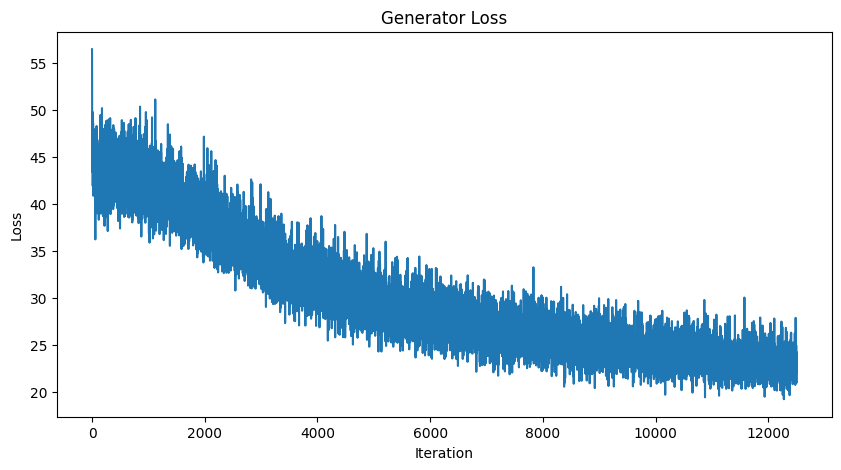

In [22]:
plt.figure(figsize=(10, 5))
plt.plot(loss_Gs)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Generator Loss')
# plt.legend()
plt.show()

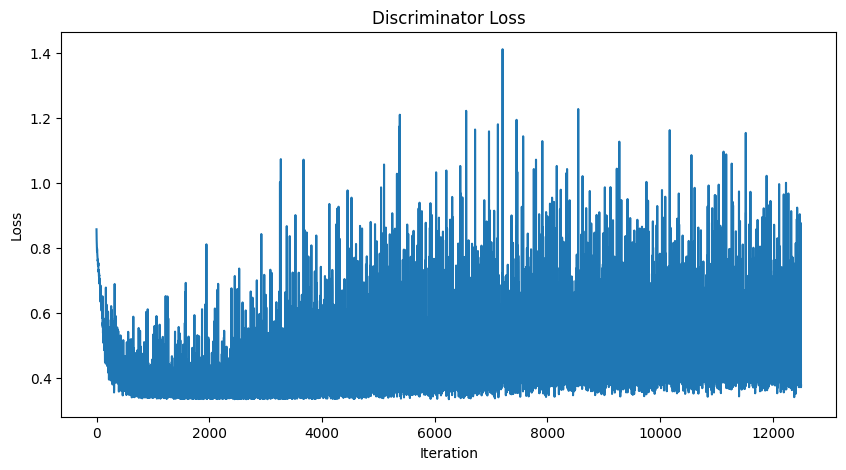

In [23]:
plt.figure(figsize=(10, 5))
plt.plot(loss_Ds)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Discriminator Loss')
# plt.legend()
plt.show()

In [24]:
from google.colab import runtime
runtime.unassign()